# Random Sample Consensus (RANSAC)
RANSAC is an iterative method to estimate a model from noisy data, published by Fischler and Bolles in 1981. Typically, the model is estimated with a minimum number of parameters. For a homography, this is 4 matches. 

RANSAC runs for a predetermined number of iterations or with a stop criteria.

Read in campus2.png. Shape: (802, 1454)
Read in campus1.png. Shape: (802, 1454)


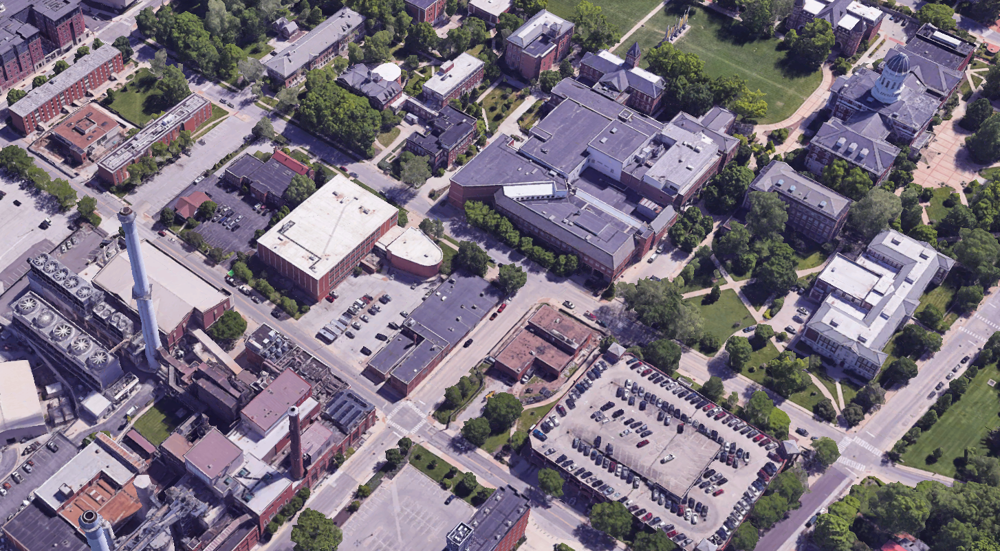

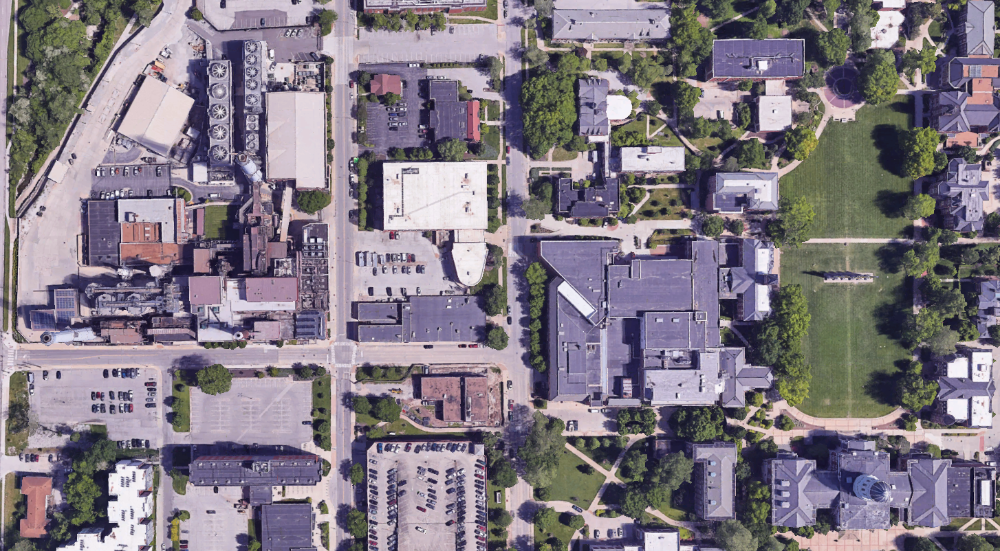

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from ReadImage import ReadImage

# image1_path = "img2.ppm"
# image2_path = "img1.ppm"

image1_path = "campus2.png"
image2_path = "campus1.png"

resize = 1.0

image1_gray, image1_rgb = ReadImage(image1_path, resize)
image2_gray, image2_rgb = ReadImage(image2_path, resize)

display(Image.fromarray(image1_rgb))
display(Image.fromarray(image2_rgb))

#### Create SIFT Object

In [2]:
# The first parameter controls the maximum number of features returned
sift = cv2.SIFT.create(1000)

# Detect keypoints and create descriptors
im1_kp, im1_ds = sift.detectAndCompute(image1_gray, None)
im2_kp, im2_ds = sift.detectAndCompute(image2_gray, None)

#### Match Features
Match features using brute force. The k nearest neighbors with k = 2 will return the two best matches, so that Lowe's ratio test can be performed.

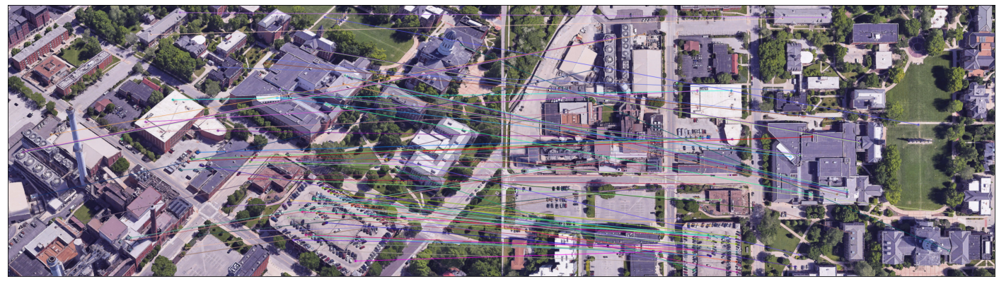

In [3]:
visualizeNMatches = 100
ratio = 0.7

# Brute force matcher OpenCV object
bf = cv2.BFMatcher(cv2.NORM_L2)

# Raw best 2 matches
rawmatches = bf.knnMatch(im1_ds, im2_ds, k=2)

# Ratio test, m and n represent the best and second best DMatch object
matches = []
for m,n in rawmatches:
    if m.distance < ratio * n.distance:
        matches.append(m)

# Sort matches based on distance, mostly for visualization
matches = sorted(matches, key = lambda x:x.distance)

# Show matches
matches_img = cv2.drawMatches(image1_rgb, im1_kp, image2_rgb, im2_kp,
                              matches[:visualizeNMatches], None,
                              flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(25,25))
plt.xticks([])
plt.yticks([])
plt.imshow(matches_img)

#### Vectorized Inlier Counting
RANSAC needs to count inliers. In this homography example, it counts how many keypoints warp within some $\epsilon$ of where it was detected. 

To vectorize this counting, the keypoints are placed in a $3\times \mathrm{N}$ numpy array. Why does this help?

In [4]:
im1AllPoints = np.zeros((3, len(matches)))
im2AllPoints = np.zeros((3, len(matches)))

for i in np.arange(len(matches)):
    im1Idx = matches[i].queryIdx
    im1AllPoints[:,i] = [im1_kp[im1Idx].pt[0], im1_kp[im1Idx].pt[1], 1]

    im2Idx = matches[i].trainIdx
    im2AllPoints[:,i] = [im2_kp[im2Idx].pt[0], im2_kp[im2Idx].pt[1], 1]

In [5]:
def CountInliers(H: np.ndarray, p1: np.ndarray, p2: np.ndarray,
                 epsilon: float = 5.0) -> int:
    
    # Use homography to perform projective transformation
    homogeneous_proj = np.matmul(H, p1)

    # Convert to Euclidean
    euc_proj = homogeneous_proj / homogeneous_proj[2]

    # Euclidean distance between projected p1 points and p2 points
    distance = np.sqrt(np.power(euc_proj[0:2,:] - p2[0:2,:], 2).sum(axis=0))

    # Number of inliers that are less than some epsilon
    inliers = (distance < epsilon).sum()

    return inliers

#### RANSAC

In [6]:
# Define number of iterations
ransacN = 1000

bestH = np.array([])
bestCount = 0

for i in np.arange(ransacN):
    # Pick 4 random points. Why 4?
    selectedIdx = np.random.randint(0, len(matches), (4,))

    # Place picked points in OpenCV's preferred format
    im1Pts = []
    im2Pts = []
    for j in selectedIdx:
        im1Pts.append(im1_kp[matches[j].queryIdx].pt)
        im2Pts.append(im2_kp[matches[j].trainIdx].pt)
    im1Pts = np.array(im1Pts)
    im2Pts = np.array(im2Pts)

    # Calculate homography, mask is not needed, but saved to make 
    # accessing H easier
    H, mask = cv2.findHomography(im1Pts, im2Pts)

    # Count inliers
    count = CountInliers(H, im1AllPoints, im2AllPoints)

    # Save the model if it has more inliers
    if count > bestCount:
        bestH = H
        bestCount = count

print("Produced homography: \n", H, f"\nNumber of inliers: {bestCount}")


Produced homography: 
 [[ 5.64038749e-01 -6.89026076e-01  6.75091669e+02]
 [ 7.12670705e-01  9.07358663e-01 -3.38519351e+02]
 [-1.32473532e-05  3.78823726e-04  1.00000000e+00]] 
Number of inliers: 43


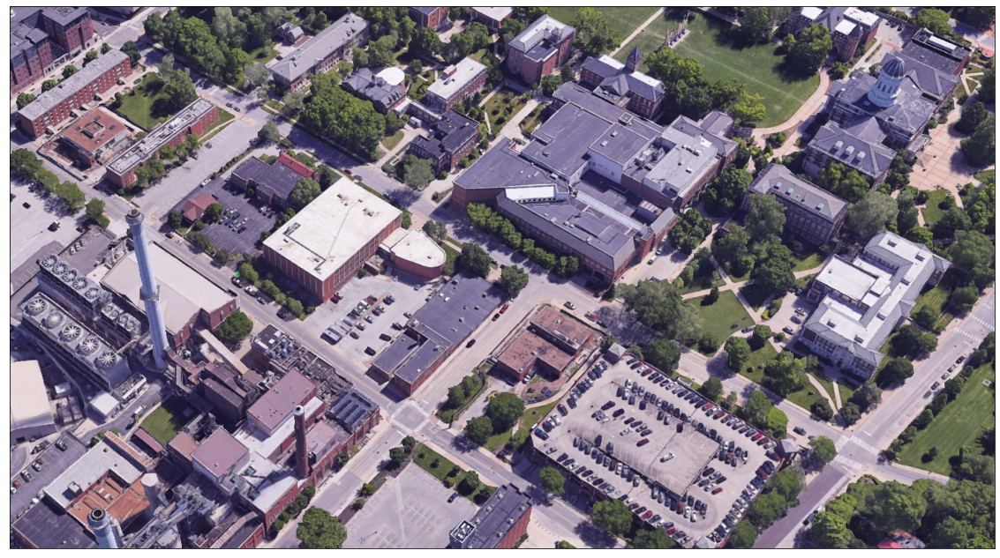

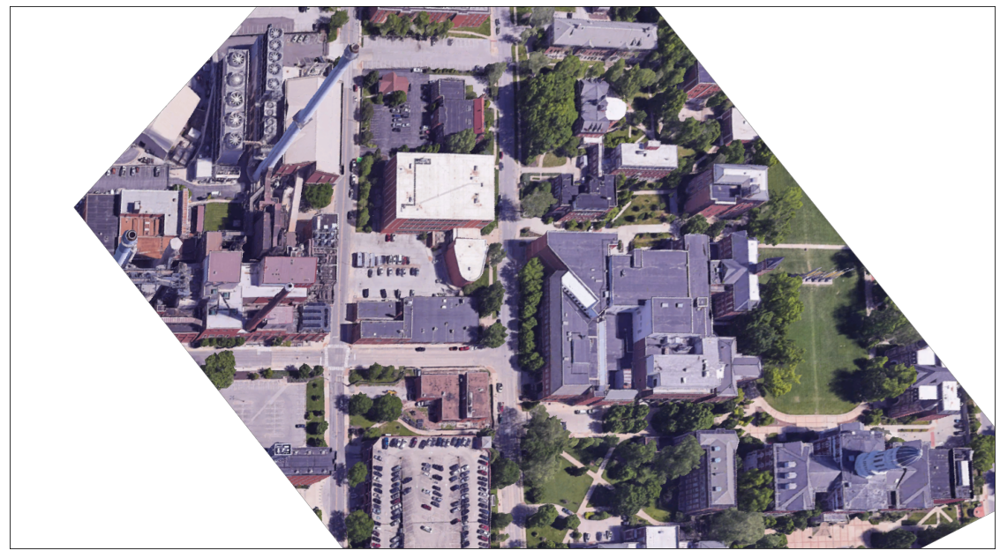

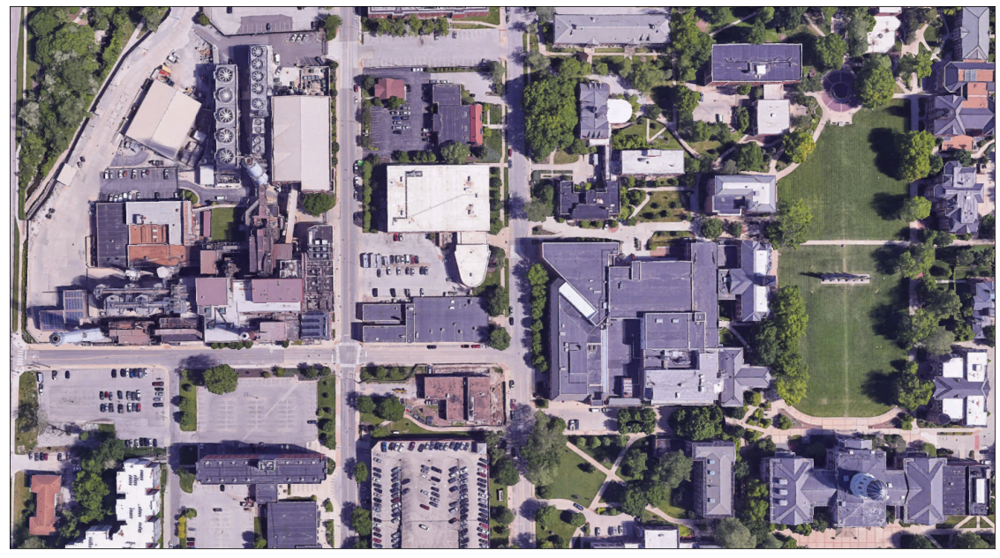

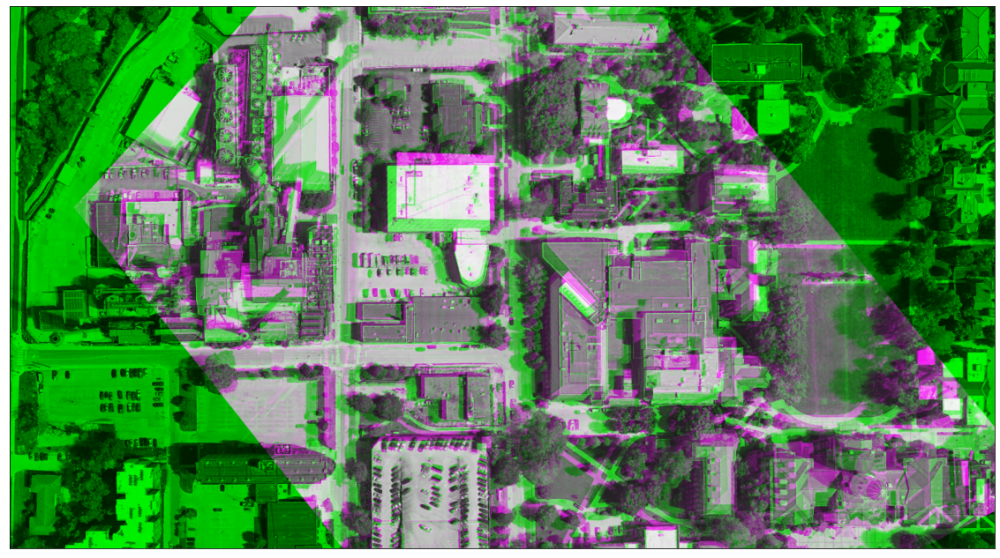

In [7]:
# Show original source image
plt.figure(figsize=(20,20))
plt.xticks([])
plt.yticks([])
plt.imshow(image1_rgb)

# Warp source image
im1_warp = cv2.warpPerspective(image1_rgb, H, (image1_rgb.shape[1], image1_rgb.shape[0]))
plt.figure(figsize=(20,20))
plt.xticks([])
plt.yticks([])
plt.imshow(im1_warp)

# Show destination image
plt.figure(figsize=(20,20))
plt.xticks([])
plt.yticks([])
plt.imshow(image2_rgb)

# Overlay warped on destination
# Purple is warped image
# Green is destination image
# Gray means the pixel is present in both images
warp_gray = cv2.cvtColor(im1_warp, cv2.COLOR_BGR2GRAY)
disparate = np.dstack((warp_gray, image2_gray, warp_gray))
plt.figure(figsize=(20,20))
plt.xticks([])
plt.yticks([])
plt.imshow(disparate)